In [1]:
%matplotlib inline
from matplotlib.pyplot import imshow
from PIL import Image
import matplotlib as mpl
mpl.rcParams['savefig.dpi'] = 180
mpl.rcParams['figure.dpi'] = 180  

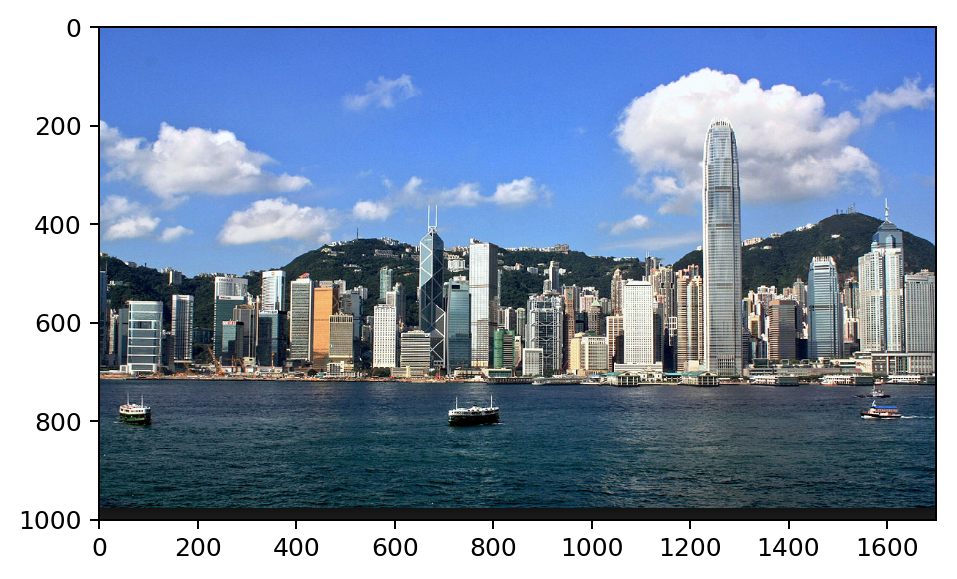

In [2]:
image = Image.open('hk.png')
imshow(image)

# 基本信息

In [3]:
print("format: {}, size: {}, mode: {}".format(image.format, image.size, image.mode))
## mode 这个属性代表图片的 band 属性, 一般情况(黑白)下为 “L”, 
## 当图片是彩色的时候是 “RGB”, 如果图片经过压缩, 则是 “CMYK”.

format: PNG, size: (1700, 1000), mode: RGBA


# 读写操作

## 保存图片

直接使用来自 Image 模块的 save() 方法来保存图片文件. 

当你保存图片文件的时候, 文件名显得尤为重要. 除非你指定扩展名, 默认情况下是自动沿袭本地存储格式的.

In [4]:
image.save("/tmp/tmp.png")

## 生成 JPEG 缩略图

In [5]:
size = (128, 128)
image.thumbnail(size)
image.save('/tmp/hk.thumbnail', 'PNG')
image.close()

# 裁剪, 粘贴 和 合成

## 从图像中拷贝出子矩形

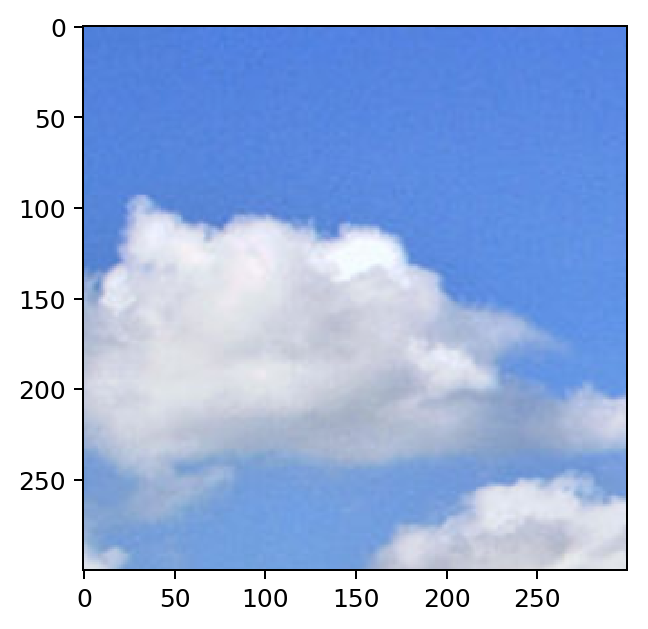

In [6]:
image = Image.open('hk.png')
box = (100, 100, 400, 400)
region = image.crop(box)
imshow(region)

## 在原图像中处理子矩形

当你修改原图像的时候, 图像区域的大小必须和原图像保持一致. 另外, 图像区域不能扩充到图像便捷之外. 

尽管如此, 原图像和目标图像的模式不必保持一致. 如果不一致, 目标图像会在保存的时候自动进行转换.

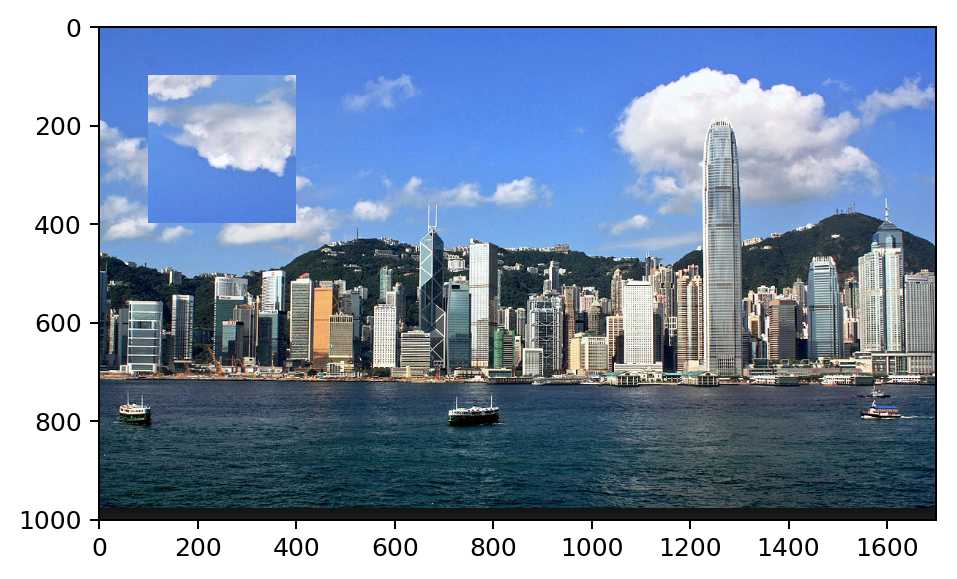

In [7]:
region = region.transpose(Image.ROTATE_180)
image.paste(region, box)
imshow(image)

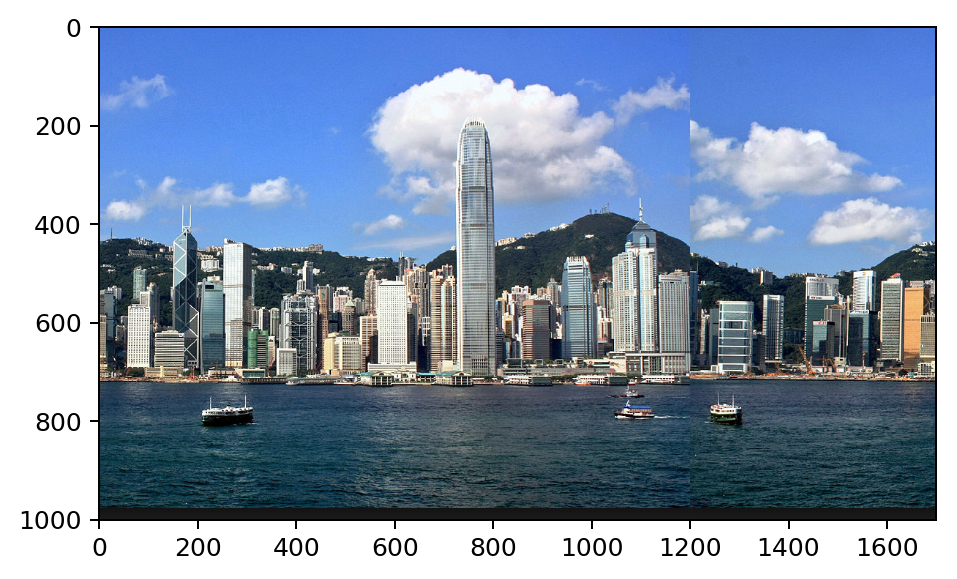

In [8]:
image.close()
image = Image.open('hk.png')

xsize, ysize = image.size
delta = 500
delta = delta % xsize
part1 = image.crop((0, 0, delta, ysize))
part2 = image.crop((delta, 0, xsize, ysize))
image.paste(part2, (0, 0, xsize-delta, ysize))
image.paste(part1, (xsize-delta, 0, xsize, ysize))
imshow(image)

## 分割与合并波段

(<PIL.Image.Image image mode=L size=1700x1000 at 0x102270860>, <PIL.Image.Image image mode=L size=1700x1000 at 0x102270940>, <PIL.Image.Image image mode=L size=1700x1000 at 0x102270B38>, <PIL.Image.Image image mode=L size=1700x1000 at 0x102270A58>)


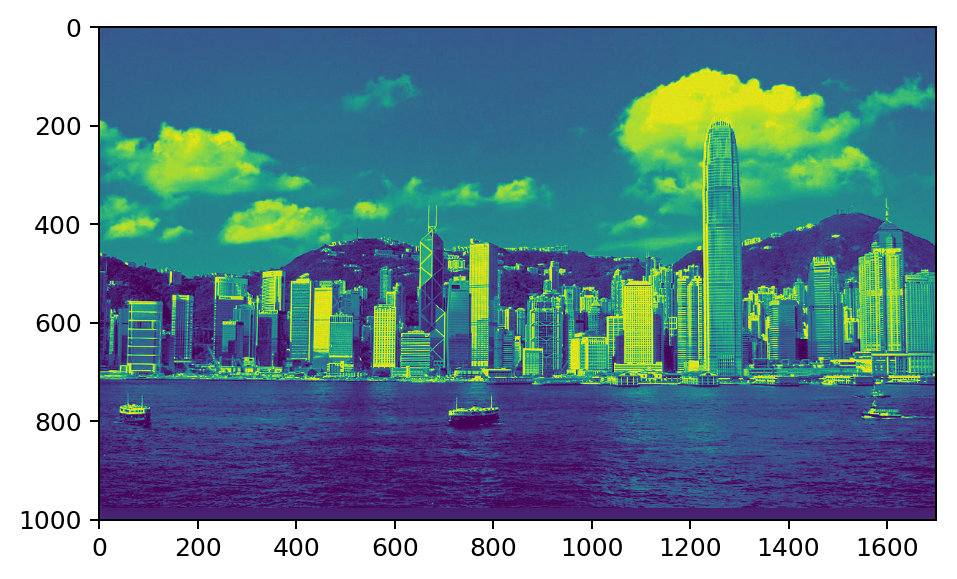

In [9]:
image.close()
image = Image.open('hk.png')
result = image.split()
print(result)
r, g, b, a = result
imshow(r)

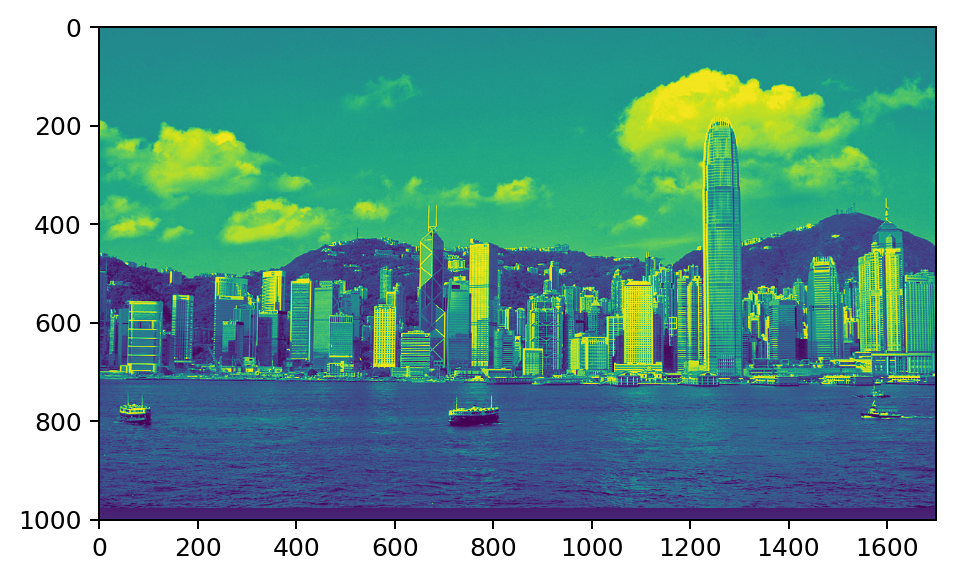

In [10]:
imshow(g)

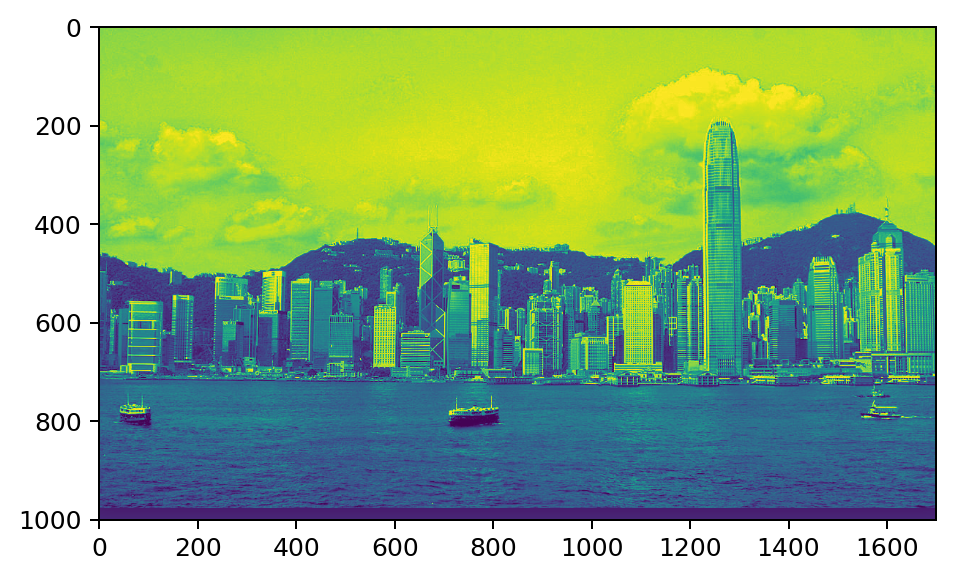

In [11]:
imshow(b)

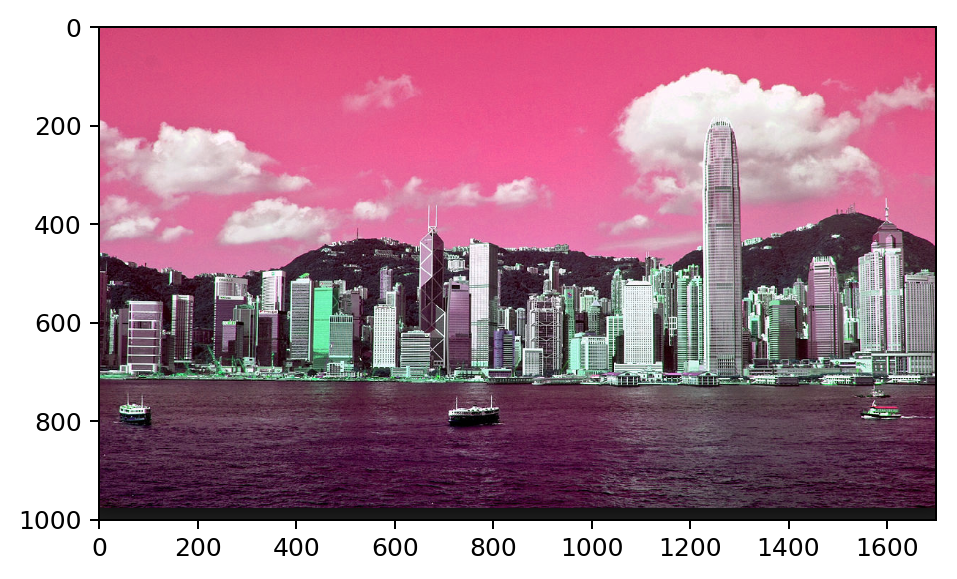

In [12]:
im = Image.merge("RGBA", (b, r, g, a))
imshow(im)

# 几何变换


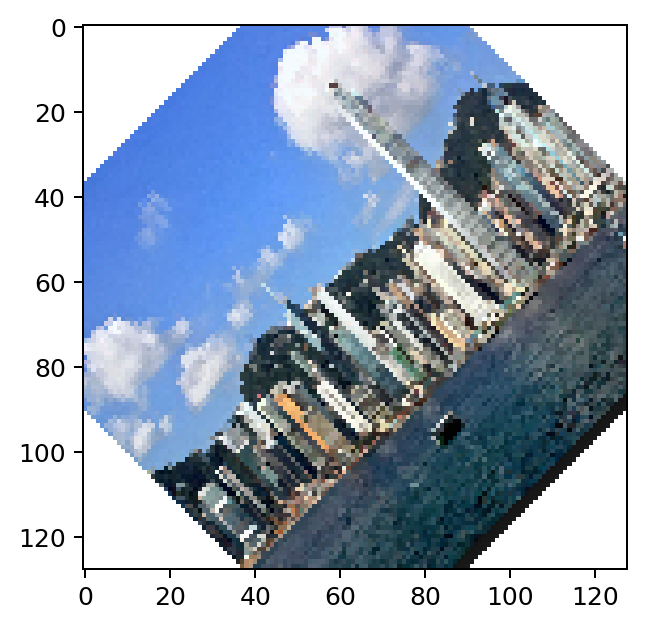

In [13]:
image.close()
image = Image.open('hk.png')
out = image.resize((128, 128))
out = out.rotate(45) # degrees counter-clockwise
imshow(out)

## 旋转图像

使用 `rotate()` 也能完成 `transpose(ROTATE)` 操作, 把 expand 参数设置为 True 来同时修改图片的尺寸.

至于修改图片方向的一般方法是使用 `transform()` 方法.

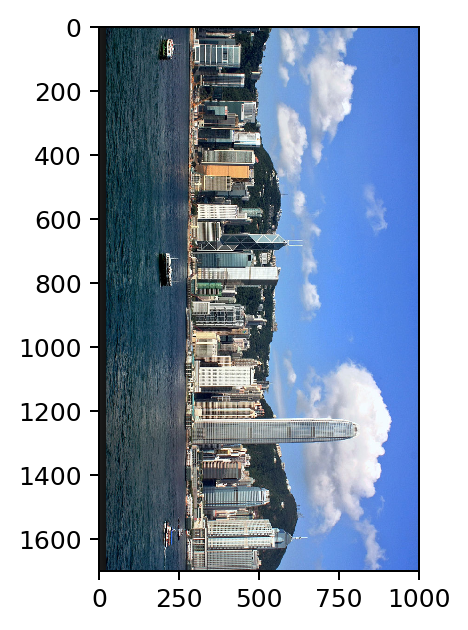

In [14]:
out1 = image.transpose(Image.FLIP_LEFT_RIGHT)
out2 = image.transpose(Image.FLIP_TOP_BOTTOM)
out3 = image.transpose(Image.ROTATE_90)
out4 = image.transpose(Image.ROTATE_180)
out5 = image.transpose(Image.ROTATE_270)
imshow(out5)

# 模式转换

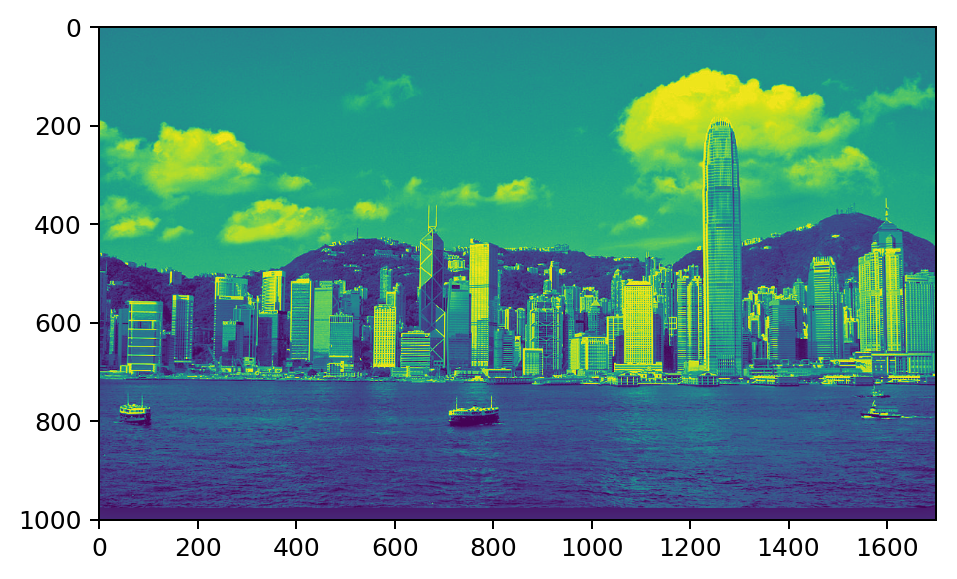

In [15]:
image.close()
image = Image.open('hk.png')
im = image.convert('L')
imshow(im)

# 效果增强

## 滤镜

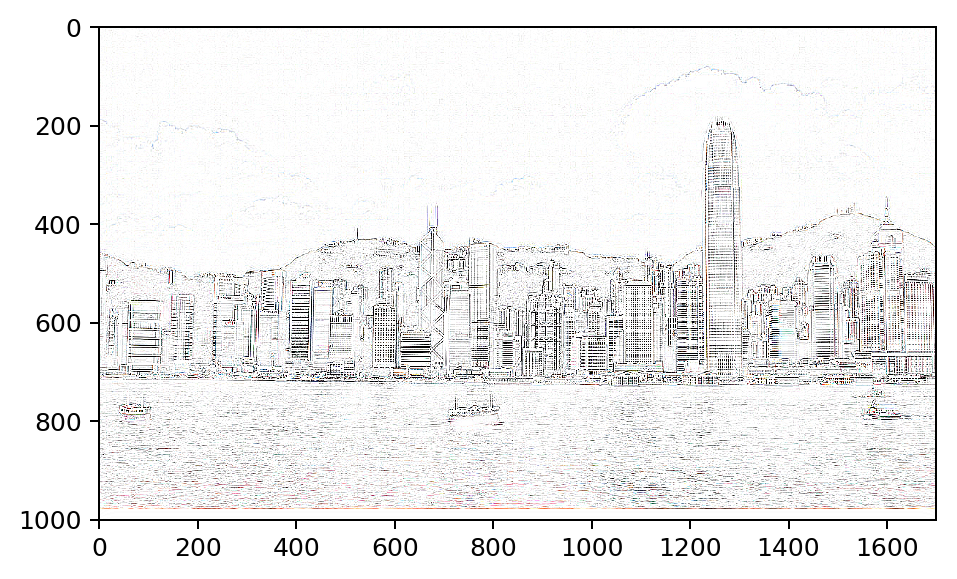

In [16]:
from PIL import ImageFilter

image.close()
image = Image.open('hk.png')
out = image.filter(ImageFilter.CONTOUR)
imshow(out)

## 浮点运算

`point()`方法用来转换图片的像素值, 例如图像的对比度. 

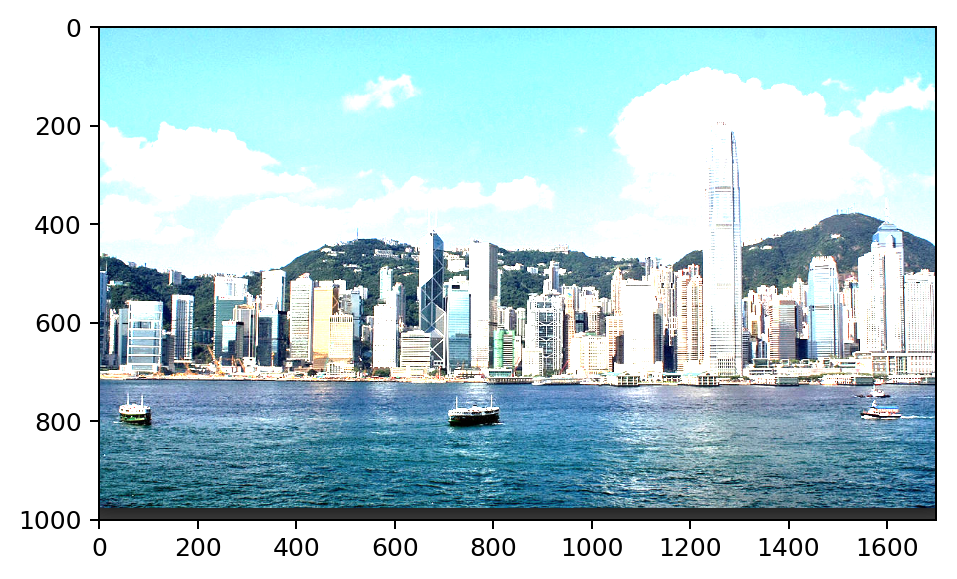

In [17]:
image.close()
image = Image.open('hk.png')
out = image.point(lambda i: i * 2.0)
imshow(out)

### 分波段处理

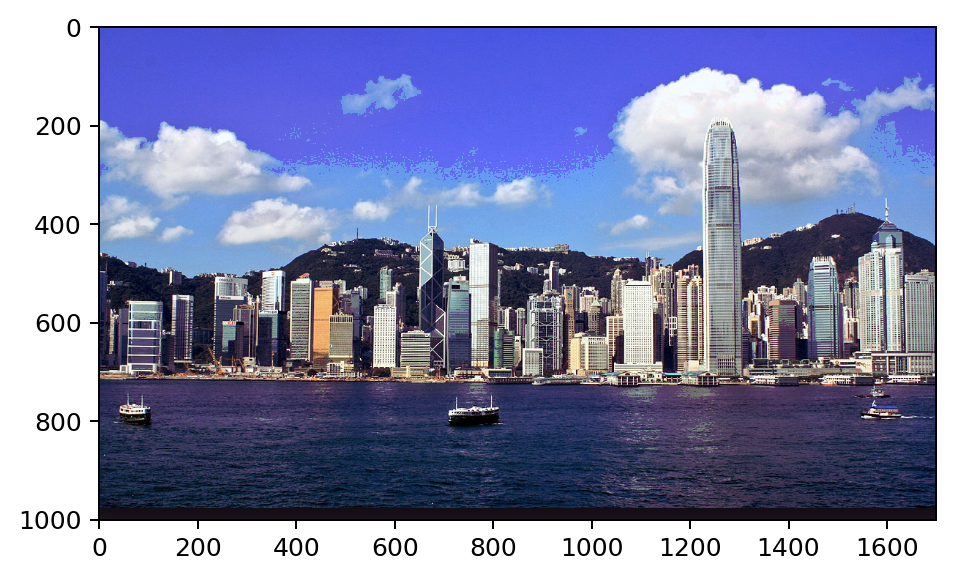

In [18]:
image.close()
image = Image.open('hk.png')

R, G, B = 0, 1, 2

# split the image into individual bands
source = image.split()
# select regions where red is less than 100
mask = source[R].point(lambda i: 255 if i < 100 else 0)
# process the green band
out = source[G].point(lambda i: i * 0.7)
# paste the processed band back, but only where red was < 100
source[G].paste(out, None, mask)
# build a new multiband image
im = Image.merge(image.mode, source)
imshow(im)
im.close()